# Import dependencies and define data traversal function

In [1]:
import json
import random
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from constants import models_formal_name, models_simple_name, datasets2desc, desc2top_type, excluded_desc, factors_color, affections_color

def iter_data():
    with open('result.jsonl', 'r+') as f:
        for line in f:
            yield json.loads(line)

# Draw the distribution of hallucinations across different LLMs

[276, 232, 314, 202, 188]


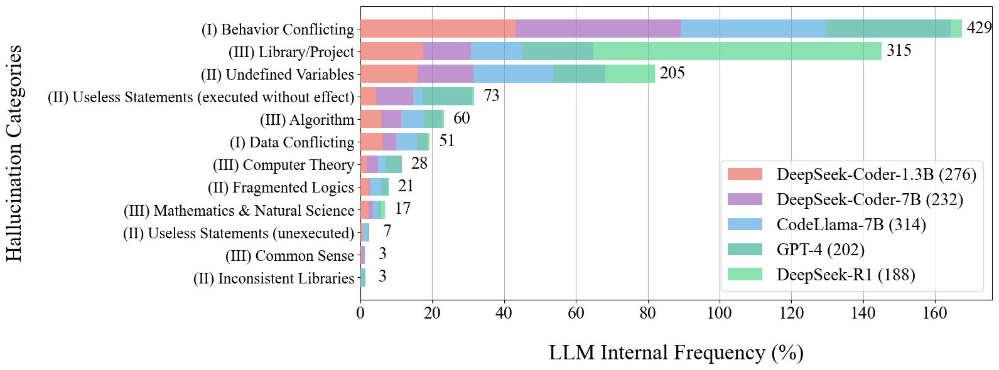

In [2]:
def main():
    desc2complete_desc = {desc: f"({['I', 'II', 'III']['RCK'.index(tp)]}) {desc}" for desc, tp in desc2top_type.items()}
    types_cnt = {v: [0, 0, 0, 0, 0] for v in desc2complete_desc.values()}

    for item in iter_data():
        for code_label in item['code_labels']:
            desc = code_label['hallucination-type']
            types_cnt[desc2complete_desc[desc]][models_simple_name.index(item['model'])] += 1

    sums = [sum(cnt[i] for cnt in types_cnt.values()) for i in range(len(models_simple_name))]
    print(sums)

    colors = ['#EC7063', '#A569BD', '#5DADE2', '#45B39D', '#58D68D']

    plt.rcParams['font.family'] = 'Times New Roman'
    fig, ax = plt.subplots(figsize=(16, 6))
    for i0, (desc, value) in enumerate(sorted(types_cnt.items(), key=lambda x: sum(x[1]))):
        left = 0
        for i, (v, c) in enumerate(zip(value, colors)):
            v = v / sums[i] * 100
            ax.barh(desc, v, left=left, color=c, alpha=0.7, zorder=3,
                    label=f'{models_formal_name[i]} ({sums[i]})' if desc == list(desc2complete_desc.values())[
                        0] else '')
            left += v
        ax.text(left + 5.0, i0, str(sum(value)), ha='center', va='center', fontsize=20, color='black')

    plt.xlabel('LLM Internal Frequency (%)', fontsize=25, labelpad=25)
    plt.ylabel('Hallucination Categories', fontsize=25, labelpad=25)
    ax.tick_params(axis='x', which='major', labelsize=20)
    ax.tick_params(axis='y', which='major', labelsize=18)
    ax.xaxis.grid(True, zorder=1)
    ax.legend(loc='lower right', fontsize=20)

    plt.tight_layout()
    plt.show()


main()

# 

# Draw the distribution of hallucinations in different datasets

[584, 449, 173]
[('CEJava', 'orange'), ('CEPython', 'green'), ('HumanEval', 'blue')]


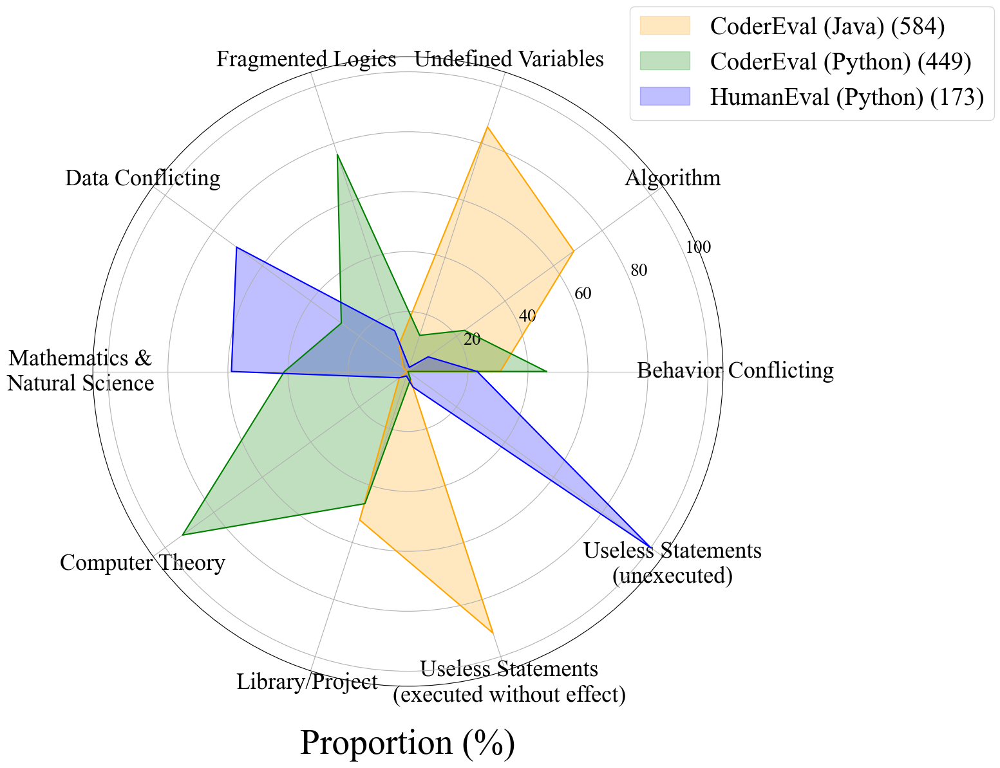

In [6]:
def map_desc(_desc):
    if _desc == 'Mathematics & Natural Science':
        return 'Mathematics &\nNatural Science'
    if _desc == 'Useless Statements (executed without effect)':
        return 'Useless Statements\n(executed without effect)'
    if _desc == 'Useless Statements (unexecuted)':
        return 'Useless Statements\n(unexecuted)'
    return _desc


def main():
    datasets = sorted(list(datasets2desc.keys()))

    types_cnt = {desc: [0, 0, 0] for desc in desc2top_type.keys() if desc not in excluded_desc}

    for item in iter_data():
        for code_label in item['code_labels']:
            tp = code_label['hallucination-type']
            if tp in excluded_desc:
                continue
            types_cnt[tp][datasets.index(item['dataset'])] += 1

    sums = [sum(v[i] for v in types_cnt.values()) for i in range(3)]
    print(sums)

    angles = np.linspace(0, 2 * np.pi, len(types_cnt), endpoint=False).tolist()
    angles += angles[:1]

    plt.rcParams['font.family'] = 'Times New Roman'
    fig, ax = plt.subplots(figsize=(16, 12), subplot_kw=dict(polar=True))

    types_desc = ['Behavior Conflicting', 'Algorithm', 'Undefined Variables', 'Fragmented Logics',
                  'Data Conflicting', 'Mathematics & Natural Science', 'Computer Theory', 'Library/Project',
                  'Useless Statements (executed without effect)', 'Useless Statements (unexecuted)']

    colors = ['orange', 'green', 'blue']

    print(list(zip(datasets, colors)))
    for i in range(3):
        values = [types_cnt[k][i] / sum(types_cnt[k]) * 100 for k in types_desc]
        values += values[:1]
        ax.fill(angles, values, color=colors[i], alpha=0.25, label=f'{datasets2desc[datasets[i]]} ({sums[i]})')
        ax.plot(angles, values, color=colors[i], linewidth=1.5)

    types_desc = [map_desc(desc) for desc in types_desc]
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(types_desc)
    plt.xlabel('Proportion (%)', fontsize=40, labelpad=25)
    ax.tick_params(axis='x', which='major', labelsize=26)
    ax.tick_params(axis='y', which='major', labelsize=20)

    ax.legend(loc='upper right', fontsize=28, bbox_to_anchor=(1.45, 1.1))
    plt.tight_layout()
    plt.show()
    

main()

# Draw category-cause-impact Sankey diagram

In [7]:
def hex_to_rgba(hex_color, alpha=1.0):
    hex_color = hex_color.lstrip('#')

    r = int(hex_color[0:2], 16)
    g = int(hex_color[2:4], 16)
    b = int(hex_color[4:6], 16)

    return f'rgba({r}, {g}, {b}, {alpha})'


def main():
    fta_desc = [v for v in sorted(factors_color.keys())] + \
               [v for v in sorted(desc2top_type.keys())] + \
               [v for v in sorted(affections_color.keys())]
    fta_desc = [desc for desc in fta_desc if desc not in excluded_desc]

    factor_affection = {x: [] for x in desc2top_type.keys()}
    random.seed(42)

    for item in iter_data():
        for code_label in item['code_labels']:
            tp = code_label['hallucination-type']
            index = random.randint(0, len(code_label['factors']) - 1)
            factor = code_label['factors'][index]
            index = random.randint(0, len(code_label['affections']) - 1)
            affection = code_label['affections'][index]
            if tp in excluded_desc:
                continue
            factor_affection[tp].append((factor, affection))

    type_colors = {
        'Behavior Conflicting': '#2471A3',
        'Data Conflicting': '#5DADE2',
        'Undefined Variables': '#1E8449',
        'Useless Statements (executed without effect)': '#27AE60',
        'Fragmented Logics': '#A9DFBF',
        'Useless Statements (unexecuted)': '#58D68D',
        'Mathematics & Natural Science': '#A3E4D7',
        'Algorithm': '#73C6B6',
        'Library/Project': '#117A65',
        'Computer Theory': '#48C9B0'
    }

    colors = {}
    colors.update(factors_color)
    colors.update(type_colors)
    colors.update(affections_color)

    link_cnt = {}
    for t, lst in factor_affection.items():
        for f, a in lst:
            f_idx = fta_desc.index(f)
            t_idx = fta_desc.index(t)
            a_idx = fta_desc.index(a)
            if (f_idx, t_idx) not in link_cnt:
                link_cnt[(f_idx, t_idx)] = 0
            if (t_idx, a_idx) not in link_cnt:
                link_cnt[(t_idx, a_idx)] = 0
            link_cnt[(f_idx, t_idx)] += 1
            link_cnt[(t_idx, a_idx)] += 1

    source = []
    target = []
    value = []

    for (s, t), v in link_cnt.items():
        source.append(s)
        target.append(t)
        value.append(v)

    nodes = dict(
        pad=25,
        thickness=30,
        line=dict(color="rgba(0,0,0,0)", width=0),
        label=fta_desc,
        color=[colors[desc] for desc in fta_desc]
    )

    links = dict(
        source=source,
        target=target,
        value=value,
        color=[hex_to_rgba(colors[fta_desc[s]], alpha=0.2) for s in source]
    )

    annotations = [
        dict(
            x=0.00,
            y=-0.12,
            text="Causes",
            showarrow=False,
            xref="paper",
            yref="paper",
            font=dict(size=50)
        ),
        dict(
            x=0.50,
            y=-0.12,
            text="Code Hallucinations",
            showarrow=False,
            xref="paper",
            yref="paper",
            font=dict(size=50)
        ),
        dict(
            x=1.00,
            y=-0.12,
            text="Impacts",
            showarrow=False,
            xref="paper",
            yref="paper",
            font=dict(size=50)
        )
    ]

    fig = go.Figure(data=[go.Sankey(
        node=nodes,
        link=links
    )])

    fig.update_layout(
        font=dict(
            family="Times New Roman",
            size=32,
            weight="bold",
        ),
        margin=dict(
            l=0,
            r=0,
            t=0,
            b=130
        ),
        width=1600,
        height=1200,
        annotations=annotations
    )
    fig.show()
    
    
main()

# Draw the distribution of prompt length and complexity 

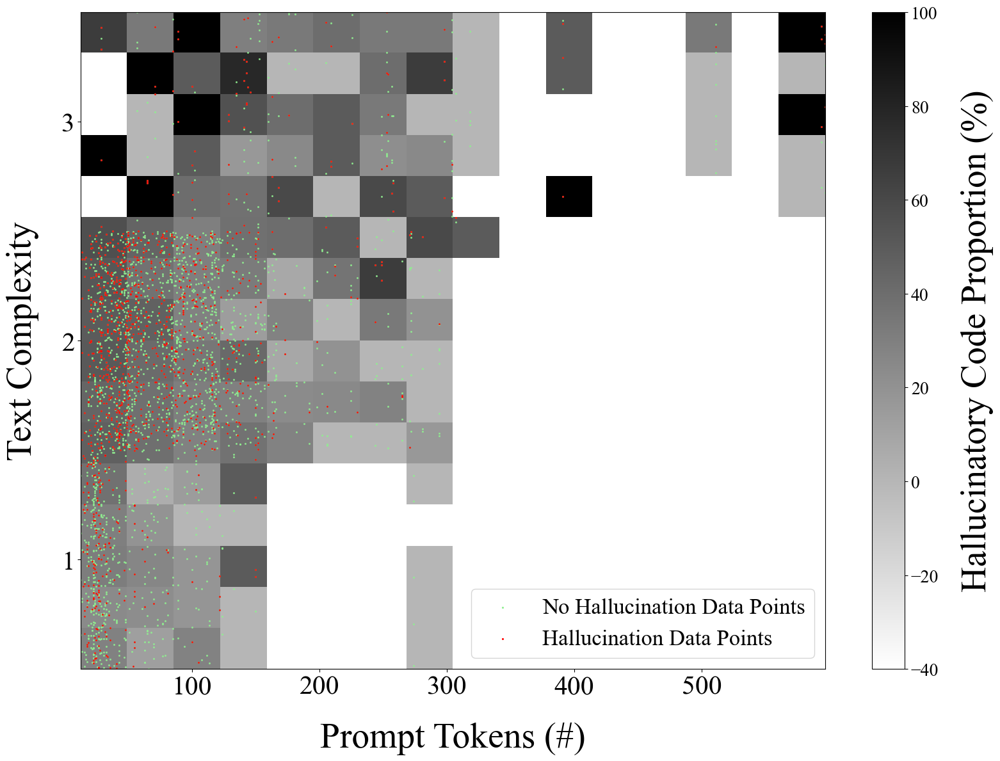

In [9]:
def main():
    lengths = []
    complexities = []
    all_lengths = []
    all_complexities = []
    random.seed(42)

    for item in iter_data():
        all_lengths.append(item['prompt_length'])
        all_complexities.append(item['prompt_label']['logic-complexity'] + random.random() - 0.5)
        # all_complexities.append(item['prompt_label']['logic-complexity'])
        if len(item['code_labels']) > 0:
            lengths.append(all_lengths[-1])
            complexities.append(all_complexities[-1])

    bins = (16, 16)  # 设定网格划分数量
    heatmap_range = ([min(*all_lengths), max(*all_lengths)], [0.5, 3.5])  # 坐标范围

    # 计算两组散点在网格中的数量
    count1, _, _ = np.histogram2d(lengths, complexities, bins=bins, range=heatmap_range)
    count2, _, _ = np.histogram2d(all_lengths, all_complexities, bins=bins, range=heatmap_range)

    # 计算比值
    ratio = np.divide(count1, count2, out=np.full_like(count1, -0.4), where=(count2 != 0)) * 100

    # 绘制热力图
    plt.rcParams['font.family'] = 'Times New Roman'
    _, ax = plt.subplots(figsize=(16, 12))
    cax = plt.imshow(ratio.T, origin='lower', extent=(*heatmap_range[0], *heatmap_range[1]), cmap='gray_r',
                     aspect='auto')
    cbar = plt.colorbar(cax)
    cbar.ax.tick_params(labelsize=20)
    cbar.set_label(label="Hallucinatory Code Proportion (%)", fontsize=40, labelpad=25)
    plt.scatter(all_lengths, all_complexities, c='lightgreen', s=1.5, label="No Hallucination Data Points", alpha=0.8)
    plt.scatter(lengths, complexities, c='red', s=1.5, label="Hallucination Data Points", alpha=0.8)
    lgd = plt.legend(fontsize=25)
    for handle in lgd.legend_handles:
        handle.set_alpha(1.0)
    plt.xlabel('Prompt Tokens (#)', fontsize=40, labelpad=25)
    plt.ylabel('Text Complexity', fontsize=40, labelpad=25)
    ax.tick_params(axis='both', which='major', labelsize=30)
    ax.set_yticks([1.0, 2.0, 3.0])
    plt.tight_layout()
    plt.savefig('prompt_analyze_origin.pdf', format='pdf')
    plt.show()
    
    
main()

# Draw the distribution of hallucination causes

{'Behavior Conflicting': [4.428904428904429, 2.564102564102564, 99.06759906759906], 'Data Conflicting': [3.9215686274509802, 7.8431372549019605, 100.0], 'Undefined Variables': [0.0, 18.048780487804876, 87.8048780487805], 'Useless Statements (executed without effect)': [1.36986301369863, 0.0, 100.0], 'Fragmented Logics': [0.0, 0.0, 100.0], 'Inconsistent Libraries': [0.0, 0.0, 100.0], 'Useless Statements (unexecuted)': [0.0, 0.0, 100.0], 'Common Sense': [0.0, 100.0, 100.0], 'Mathematics & Natural Science': [0.0, 70.58823529411765, 52.94117647058824], 'Algorithm': [0.0, 16.666666666666664, 93.33333333333333], 'Library/Project': [0.31746031746031744, 72.06349206349206, 40.95238095238095], 'Computer Theory': [0.0, 50.0, 82.14285714285714]}


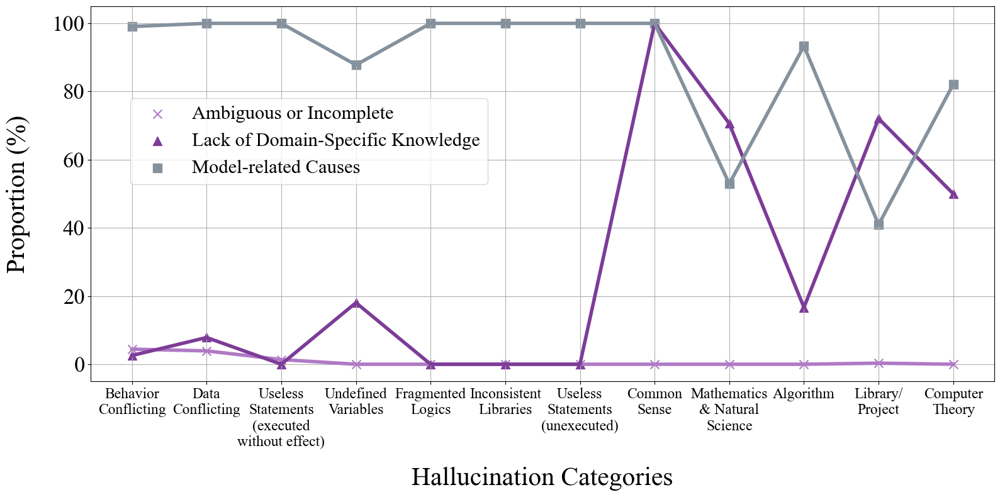

In [13]:
def map_desc(_desc):
    if _desc.count(' ') == 1:
        return _desc.replace(' ', '\n')
    if _desc.count('/') == 1:
        return _desc.replace('/', '/\n')
    if _desc == 'Mathematics & Natural Science':
        return 'Mathematics\n& Natural\nScience'
    if _desc == 'Useless Statements (executed without effect)':
        return 'Useless\nStatements\n(executed\nwithout effect)'
    if _desc == 'Useless Statements (unexecuted)':
        return 'Useless\nStatements\n(unexecuted)'
    return _desc


def main(target='factor'):
    if target == 'factor':
        target_desc = factors_color.keys()
    else:
        target_desc = affections_color.keys()
    targets = sorted(set(target_desc))
    targets_cnt = {v: [0] * len(targets) for v in desc2top_type.keys()}
    types_cnt = {v: 0 for v in desc2top_type.keys()}

    for item in iter_data():
        for code_label in item['code_labels']:
            tp = code_label['hallucination-type']
            types_cnt[tp] += 1
            for t in code_label[f'{target}s']:
                targets_cnt[tp][targets.index(t)] += 1

    targets_cnt = {k: [v[i] / types_cnt[k] * 100 for i in range(len(v))] for k, v in targets_cnt.items()}
    print(targets_cnt)

    plt.rcParams['font.family'] = 'Times New Roman'
    fig, ax = plt.subplots(figsize=(16, 8))

    if target == 'factor':
        markers = {
            'Ambiguous or Incomplete': 'x',
            'Model-related Causes': 's',
            'Lack of Domain-Specific Knowledge': '^'
        }
        colors = factors_color
    else:
        markers = {
            'Incorrect Functionality': 'D',
            'Low Efficiency': '^',
            'Poor Readability': 's',
            'Poor Maintainability and Scalability': 'o'
        }
        colors = affections_color

    desc_list = list(targets_cnt.keys())
    desc_list[2], desc_list[3] = desc_list[3], desc_list[2]
    if target != 'factor':
        desc_list[2], desc_list[7] = desc_list[7], desc_list[2]
        desc_list[3], desc_list[5] = desc_list[5], desc_list[3]
        desc_list[6], desc_list[8] = desc_list[8], desc_list[6]
        desc_list[4], desc_list[6] = desc_list[6], desc_list[4]
    for i in range(len(targets)):
        lst = [targets_cnt[desc][i] for desc in desc_list]
        ax.plot([x for x in range(len(desc_list))], lst, linewidth=4, zorder=3, alpha=1.0, color=colors[targets[i]])
        ax.scatter([x for x in range(len(desc_list))], lst, alpha=1.0, marker=markers[targets[i]],
                   color=colors[targets[i]], s=100, label=targets[i])

    ax.xaxis.grid(True, zorder=1)
    ax.yaxis.grid(True, zorder=1)
    plt.xlabel('Hallucination Categories', fontsize=30, labelpad=20)
    plt.ylabel('Proportion (%)', fontsize=30, labelpad=25)
    ax.tick_params(axis='x', which='major', labelsize=17)
    ax.tick_params(axis='y', which='major', labelsize=25)
    ax.set_xticks([x for x in range(len(desc_list))])
    ax.set_xticklabels([map_desc(desc) for desc in desc_list])
    if target == 'factor':
        ax.legend(loc='lower right', fontsize=22, bbox_to_anchor=(0.45, 0.5))
    else:
        ax.legend(loc='lower right', fontsize=22, bbox_to_anchor=(0.44, 0.5))
    plt.tight_layout()
    plt.show()
    

main()

# Draw the distribution of hallucination impacts

{'Behavior Conflicting': [98.83449883449883, 1.3986013986013985, 2.797202797202797, 3.4965034965034967], 'Data Conflicting': [100.0, 0.0, 5.88235294117647, 5.88235294117647], 'Undefined Variables': [100.0, 0.4878048780487805, 6.341463414634147, 57.073170731707314], 'Useless Statements (executed without effect)': [0.0, 97.26027397260275, 1.36986301369863, 9.58904109589041], 'Fragmented Logics': [95.23809523809523, 4.761904761904762, 4.761904761904762, 9.523809523809524], 'Inconsistent Libraries': [100.0, 0.0, 0.0, 0.0], 'Useless Statements (unexecuted)': [0.0, 57.14285714285714, 28.57142857142857, 85.71428571428571], 'Common Sense': [100.0, 0.0, 0.0, 0.0], 'Mathematics & Natural Science': [100.0, 0.0, 0.0, 0.0], 'Algorithm': [46.666666666666664, 61.66666666666667, 5.0, 6.666666666666667], 'Library/Project': [97.77777777777777, 2.857142857142857, 3.8095238095238098, 5.714285714285714], 'Computer Theory': [100.0, 0.0, 0.0, 3.571428571428571]}


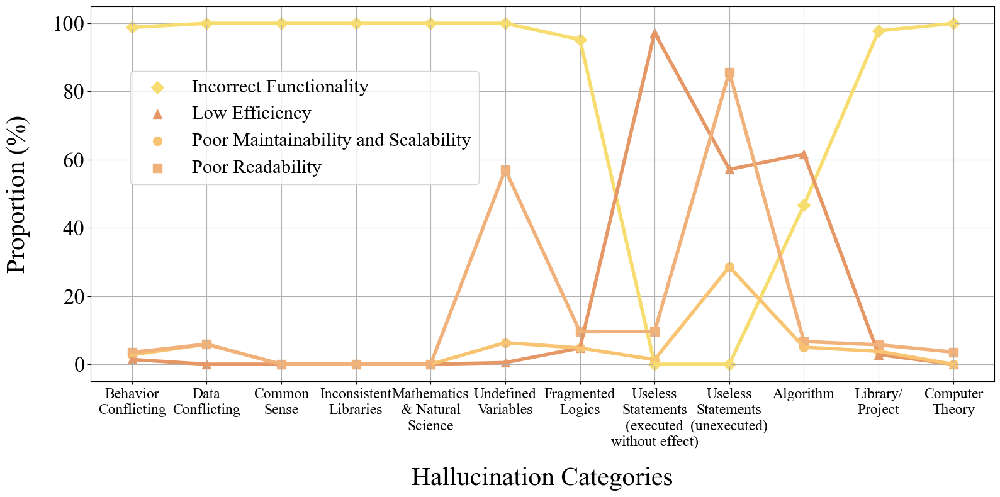

In [15]:
main('affection')